In [250]:
import IPython
import os
import matplotlib.pyplot as plt
import glob
import multiprocessing as mp
import numpy as np
import random
import tensorflow as tf

from pydub import AudioSegment
from scipy.io import wavfile

In [251]:
audio_files = glob.glob("../data/raw/positives/*/*")
audio_file = audio_files[1]

In [252]:
IPython.display.Audio(audio_file)

In [427]:
# Load a wav file
def get_wav_info(wav_file):
    rate, data = wavfile.read(wav_file)
    return rate, data

In [412]:
def graph_spectrogram(wav_file, nfft=512, fs=2, noverlap=256):
    """
    Calculate and plot spectrogram for a wav audio file
    :param wav_file:
    :param nfft: Length of each window segment
    :param fs: Sampling frequencies
    :param noverlap: Overlap between windows
    :return:
    """
    rate, data = get_wav_info(wav_file)
    nchannels = data.ndim

    if nchannels > 1:
        data = data[:, 0]

    pxx, _, _, _ = plt.specgram(data, nfft, fs, noverlap=noverlap)

    return pxx

In [515]:
sample_duration_ms = 5000 # duration of a sample in ms
Tx = 4797 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram
Ty = 1196 # The number of time steps in the output of our model
frame_rate = 48000

In [516]:
# Load raw audio files for speech synthesis
def load_raw_audio():
    positives = {}
    backgrounds = []
    negatives = []
    
    for filepath in glob.glob("../data/raw/positives/*/*.wav"):
        label = filepath.split("/")[-2]
        positive = AudioSegment.from_wav(filepath).set_frame_rate(frame_rate)
        positives.setdefault(label, [])
        positives[label].append(positive)
        
    for filepath in glob.glob("../data/raw/backgrounds/*.wav"):
        background = AudioSegment.from_wav(filepath).set_frame_rate(frame_rate)
        backgrounds.append(background)
        
    for filepath in glob.glob("../data/raw/negatives/*.wav"):
        negative = AudioSegment.from_wav(filepath).set_frame_rate(frame_rate)
        negatives.append(negative)
        
    return positives, negatives, backgrounds

In [517]:
positives, negatives, backgrounds = load_raw_audio()

In [518]:
def get_random_time_segment(segment_ms, background_duration_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    segment_start = np.random.randint(low=0, high=background_duration_ms-segment_ms)   # Make sure segment doesn't run past the 10sec background 
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

In [519]:
def is_overlapping(segment_time, previous_segments):
    """
    Checks if the time of a segment overlaps with the times of existing segments.
    
    Arguments:
    segment_time -- a tuple of (segment_start, segment_end) for the new segment
    previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments
    
    Returns:
    True if the time segment overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = segment_time
    
    # Step 1: Initialize overlap as a "False" flag. (≈ 1 line)
    overlap = False
    
    # Step 2: loop over the previous_segments start and end times.
    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end and segment_end >= previous_start:
            overlap = True

    return overlap

In [520]:
def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Arguments:
    background -- a 10 second background audio recording.  
    audio_clip -- the audio clip to be inserted/overlaid. 
    previous_segments -- times where audio segments have already been placed
    
    Returns:
    new_background -- the updated background audio
    """
    
    # Get the duration of the audio clip in ms
    segment_ms = len(audio_clip)
    # Get the duration of the background clip in ms
    background_duration_ms = len(background)

    segment_time = get_random_time_segment(segment_ms, background_duration_ms)
    
    i=0
    while is_overlapping(segment_time, previous_segments):
        if i < 10:
            segment_time = get_random_time_segment(segment_ms, background_duration_ms)
            i+=1
        else:
            return background, (background_duration_ms, background_duration_ms)

    previous_segments.append(segment_time)
    new_background = background.overlay(audio_clip, position = segment_time[0])
    
    return new_background, segment_time
    


In [521]:
audio_clip, segment_time = insert_audio_clip(backgrounds[0], positives["aoc"][0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

Segment Time:  (23085, 24278)


In [522]:
def insert_labels(y, word, segment_end_ms, backgound_duration_ms):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
    50 followinf labels should be ones.


    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms

    Returns:
    y -- updated labels
    """

    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / backgound_duration_ms)
    
    # Add 1 to the correct index in the background label (y)
    for i in range(segment_end_y + 1, segment_end_y + 51):
        if i < Ty:
            y[i, word] = 1
    
    return y

In [523]:
def cut_audio_segment(audio_segment, targeted_duration):
    duration = len(audio_segment)
    if targeted_duration < duration:
        segment_start = np.random.randint(low=0, high=duration-targeted_duration)   # Make sure segment doesn't run past the 10sec background 
        segment_end = segment_start + targeted_duration - 1
        return audio_segment[segment_start:segment_end]
    else:
        return audio_segment

In [524]:
# Used to standardize volume of audio clip
def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

In [525]:
def create_training_example(background, background_duration_ms, positives, negatives, export = False):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
    background -- a  background audio recording
    background_duration_ms -- background duration we want in ms
    activates -- a list of audio segments of the word "activate"
    negatives -- a list of audio segments of random words that are not "activate"
    
    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    """
    
    background = cut_audio_segment(background, background_duration_ms)
    
    # Make background quieter
    background = background - 20
    
    # get num_classes from positives dir
    num_classes = len(positives.keys()) + 1

    # Step 1: Initialize y (label vector) of zeros (≈ 1 line)
    y = np.zeros((Ty, num_classes))

    # Step 2: Initialize segment times as empty list (≈ 1 line)
    previous_segments = []
    
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings for 10 seconds record
    number_of_activates = np.random.randint(1, 5*background_duration_ms/10000)
    print("p", number_of_activates)
    for i in range(number_of_activates):
        y_label, label = random.choice(list(enumerate(sorted(list(positives.keys())))))
        y_label += 1
        random_positive = random.choice(positives[label])

        # Insert the audio clip on the background
        random_positive = match_target_amplitude(random_positive, -20.0)
        background, segment_time = insert_audio_clip(background, random_positive, previous_segments)

        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time

        # Insert labels in "y"
        y = insert_labels(y, y_label, segment_end, background_duration_ms)

    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3*background_duration_ms/10000)
    print("n", number_of_negatives)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    # Step 4: Loop over randomly selected negative clips and insert in background
    for random_negative in random_negatives:
        random_negative = match_target_amplitude(random_negative, -20.0)
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)

    # Export new training example 
    file_handle = background.export("train" + ".wav", format="wav")
    print("File (train.wav) was saved in your directory.")

    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")

    return np.swapaxes(x,0,1), y

In [526]:
def insert_ones(y, segment_end_ms,background_duration_ms):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
    50 followinf labels should be ones.
    
    
    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms
    
    Returns:
    y -- updated labels
    """
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / background_duration_ms)
    
    # Add 1 to the correct index in the background label (y)
    for i in range(segment_end_y + 1, segment_end_y + 51):
        if i < Ty:
            y[0, i] = 1
    
    return y

In [527]:
def create_training_example_2(background, background_duration_ms, positives, negatives, export = False):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
    background -- a  background audio recording
    background_duration_ms -- background duration we want in ms
    activates -- a list of audio segments of the word "activate"
    negatives -- a list of audio segments of random words that are not "activate"
    
    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    """
    
    background = cut_audio_segment(background, background_duration_ms)
    # Make background quieter
    background = match_target_amplitude(background, -45)

    # Step 1: Initialize y (label vector) of zeros (≈ 1 line)
    y = np.zeros((1, Ty))

    # Step 2: Initialize segment times as empty list (≈ 1 line)
    previous_segments = []
    
    # Select 0-2 random "activate" audio clips from the entire list of "activates" recordings for 10 seconds record
    number_of_sound_to_add = np.random.randint(1, 3*background_duration_ms/5000)
    for i in range(number_of_sound_to_add):
        if random.random() > 1/3:

            # Take random positive with random label and get the right amplitude
            label = random.choice(list(positives.keys()))
            random_positive = random.choice(positives[label])
            random_positive = match_target_amplitude(random_positive, -20.0)
            # Insert the audio clip on the background
            background, segment_time = insert_audio_clip(background, random_positive, previous_segments)
            
            # Retrieve segment_start and segment_end from segment_time
            segment_start, segment_end = segment_time
            # Insert labels in "y"
            y = insert_ones(y, segment_end, background_duration_ms)

        else:

            # Take random negative and get the right amplitude
            random_negative = random.choice(negatives)
            random_negative = match_target_amplitude(random_negative, -20.0)
            background, _ = insert_audio_clip(background, random_negative, previous_segments)
    
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)
    print("lenbackground", len(background))

    # Export new training example 
    
    file_handle = background.export("train" + ".wav", format="wav")
    print("File (train.wav) was saved in your directory.")

    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")

    return np.swapaxes(x,0,1), y

lenbackground 4999
File (train.wav) was saved in your directory.
rate 48000 data (239952, 2)


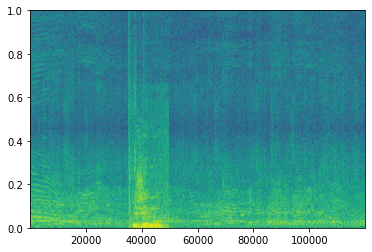

In [528]:
print(random.choice(backgrounds))
x, y = create_training_example_2(random.choice(backgrounds), sample_duration_ms, positives, negatives, export = True)
IPython.display.Audio("train.wav")

In [529]:
48000 > 936
42000 > 819

True

In [6]:
5000 - 48000 -> 936
6000 - 48000 -> 1123
6000 - 49000 -> 1147


SyntaxError: invalid syntax (<ipython-input-6-05f93abcf341>, line 1)

In [4]:
48000*1147/49000

1123.591836734694

In [548]:
936/48000

0.0195

In [547]:
936/48000

97.5

In [ ]:
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
=================================================================
input_1 (InputLayer)         [(None, 936, 257)]        0         
_________________________________________________________________
conv1d (Conv1D)              (None, 231, 196)          755776    
_________________________________________________________________
batch_normalization (BatchNo (None, 231, 196)          784       
_________________________________________________________________
activation (Activation)      (None, 231, 196)          0         
_________________________________________________________________
gru (GRU)                    (None, 231, 256)          347904    
_________________________________________________________________
batch_normalization_1 (Batch (None, 231, 256)          1024      
_________________________________________________________________
gru_1 (GRU)                  (None, 231, 256)          393984    
_________________________________________________________________
batch_normalization_2 (Batch (None, 231, 256)          1024      
_________________________________________________________________
dropout (Dropout)            (None, 231, 256)          0         
_________________________________________________________________
time_distributed (TimeDistri (None, 231, 21)           5397      
=================================================================

In [ ]:
kernel_size=15, strides=4

In [546]:
round((1080-15+4)/4)

267

In [542]:
⌊(𝑛ℎ−𝑘ℎ+𝑝ℎ+𝑠ℎ)/𝑠ℎ⌋×⌊(𝑛𝑤−𝑘𝑤+𝑝𝑤+𝑠𝑤)/𝑠𝑤⌋

234

In [531]:
x.shape, y.shape

((936, 257), (1, 1196))

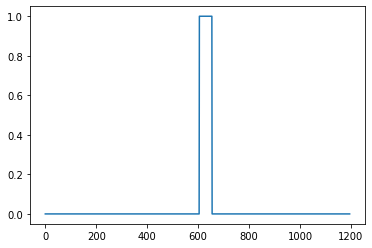

In [486]:
plt.plot(y[0])

In [138]:
def _float_feature(value):
    return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

In [139]:
def np_to_tfrecords(X, Y, file_path_prefix, verbose=True):
    """
    Converts a Numpy array (or two Numpy arrays) into a tfrecord file.
    For supervised learning, feed training inputs to X and training labels to Y.
    For unsupervised learning, only feed training inputs to X, and feed None to Y.
    The length of the first dimensions of X and Y should be the number of samples.
    
    Parameters
    ----------
    X : numpy.ndarray of rank 2
        Numpy array for training inputs. Its dtype should be float32, float64, or int64.
        If X has a higher rank, it should be rshape before fed to this function.
    Y : numpy.ndarray of rank 2 or None
        Numpy array for training labels. Its dtype should be float32, float64, or int64.
        None if there is no label array.
    file_path_prefix : str
        The path and name of the resulting tfrecord file to be generated, without '.tfrecords'
    verbose : bool
        If true, progress is reported.
    
    Raises
    ------
    ValueError
        If input type is not float (64 or 32) or int.
    
    """
    def _dtype_feature(ndarray):
        """match appropriate tf.train.Feature class with dtype of ndarray. """
        assert isinstance(ndarray, np.ndarray)
        dtype_ = ndarray.dtype
        if dtype_ == np.float64 or dtype_ == np.float32:
            return lambda array: tf.train.Feature(float_list=tf.train.FloatList(value=array))
        elif dtype_ == np.int64:
            return lambda array: tf.train.Feature(int64_list=tf.train.Int64List(value=array))
        else:  
            raise ValueError("The input should be numpy ndarray. \
                               Instaed got {}".format(ndarray.dtype))
            
    assert isinstance(X, np.ndarray)
    assert len(X.shape) == 2  # If X has a higher rank, 
                               # it should be rshape before fed to this function.
    assert isinstance(Y, np.ndarray) or Y is None
    
    # load appropriate tf.train.Feature class depending on dtype
    dtype_feature_x = _dtype_feature(X)
    if Y is not None:
        assert X.shape[0] == Y.shape[0]
        assert len(Y.shape) == 2
        dtype_feature_y = _dtype_feature(Y)            
    
    # Generate tfrecord writer
    result_tf_file = file_path_prefix + '.tfrecords'
    writer = tf.python_io.TFRecordWriter(result_tf_file)
    if verbose:
        print("Serializing {:d} examples into {}".format(X.shape[0], result_tf_file))
        
    # iterate over each sample,
    # and serialize it as ProtoBuf.
    for idx in range(X.shape[0]):
        x = X[idx]
        if Y is not None:
            y = Y[idx]
        
        d_feature = {}
        d_feature['X'] = dtype_feature_x(x)
        if Y is not None:
            d_feature['Y'] = dtype_feature_y(y)
            
        features = tf.train.Features(feature=d_feature)
        example = tf.train.Example(features=features)
        serialized = example.SerializeToString()
        writer.write(serialized)
    
    if verbose:
        print("Writing {} done!".format(result_tf_file))   

In [140]:
def _dtype_feature(nparray):
    """match appropriate tf.train.Feature class with dtype of ndarray. """
    dtype_ = nparray.dtype
    if dtype_ == np.float64 or dtype_ == np.float32:
        return tf.train.Feature(float_list=tf.train.FloatList(value=nparray))
    elif dtype_ == np.int64:
        return tf.train.Feature(int64_list=tf.train.Int64List(value=nparray))

def serialize_example(x, y):
    d_feature = {
        'X': _dtype_feature(x), 
        'Y': _dtype_feature(y)
    }

    features = tf.train.Features(feature=d_feature)
    example = tf.train.Example(features=features)
    return example.SerializeToString()


In [141]:
n_samples = 10000
sample_duration_ms = 5000
i = 0
result_tf_file = "../data/interim/{:0>5d}.tfrecord".format(i)
writer = tf.python_io.TFRecordWriter(result_tf_file)
for i in range(1, n_samples + 1):
    x, y = create_training_example_2(random.choice(backgrounds), sample_duration_ms, positives, negatives)
    serialized_example = serialize_example(x.reshape(-1), y.reshape(-1))
    writer.write(serialized_example)
    if i % 50 == 0:
        writer.close()
        print(i)
        result_tf_file = "../data/interim/{:0>5d}.tfrecord".format(i)
        writer = tf.python_io.TFRecordWriter(result_tf_file)
writer.close()

50
100
150
200


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x1147c1ae8> (for post_execute):


KeyboardInterrupt: 